In [1]:
import pandas as pd
import numpy as np
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
df = pd.read_csv("C:/Users/savil/Downloads/bank-additional/bank-additional/bank-additional-full.csv", sep=';')

In [5]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [8]:
df.shape

(41188, 21)

In [12]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [13]:
df.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

### Data already clean, nice, saves me trouble

In [14]:
df.dtypes

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                  object
dtype: object

In [15]:
df['y'].unique()

array(['no', 'yes'], dtype=object)

In [16]:
# Data Profiling
import pandas_profiling as pp

In [18]:
dir(pp)

['Config',
 'ProfileReport',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__init__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '__version__',
 'clear_config',
 'config',
 'controller',
 'model',
 'pandas_decorator',
 'profile_report',
 'report',
 'serialize_report',
 'utils',
 'version',
 'visualisation']

In [21]:
pp.ProfileReport(df, orange_mode = True)

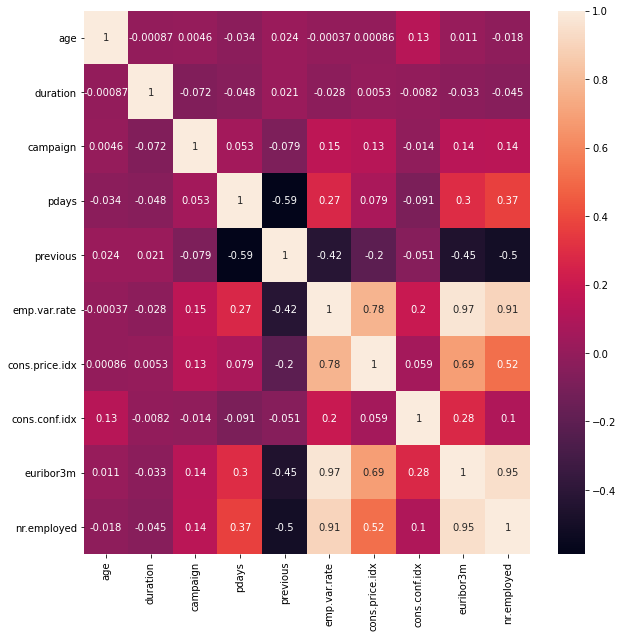

In [27]:
corr = df.corr()
plt.figure(figsize = (10,10))
sns.heatmap(corr, annot = True, cbar = True)
plt.show()

### Comparisons
+ It took 4 lines to create a correlation heatmap
+ But just 1 line with pandas profiling, including many other EDA exercises 

In [ ]:
pp.visualisation()

## Change the many categorical values to integers

In [22]:
df.columns[df.dtypes == 'object']

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'poutcome', 'y'],
      dtype='object')

In [30]:
dir(pd)

['BooleanDtype',
 'Categorical',
 'CategoricalDtype',
 'CategoricalIndex',
 'DataFrame',
 'DateOffset',
 'DatetimeIndex',
 'DatetimeTZDtype',
 'ExcelFile',
 'ExcelWriter',
 'Float64Index',
 'Grouper',
 'HDFStore',
 'Index',
 'IndexSlice',
 'Int16Dtype',
 'Int32Dtype',
 'Int64Dtype',
 'Int64Index',
 'Int8Dtype',
 'Interval',
 'IntervalDtype',
 'IntervalIndex',
 'MultiIndex',
 'NA',
 'NaT',
 'NamedAgg',
 'Period',
 'PeriodDtype',
 'PeriodIndex',
 'RangeIndex',
 'Series',
 'SparseDtype',
 'StringDtype',
 'Timedelta',
 'TimedeltaIndex',
 'Timestamp',
 'UInt16Dtype',
 'UInt32Dtype',
 'UInt64Dtype',
 'UInt64Index',
 'UInt8Dtype',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__docformat__',
 '__file__',
 '__getattr__',
 '__git_version__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '__version__',
 '_config',
 '_hashtable',
 '_is_numpy_dev',
 '_lib',
 '_libs',
 '_np_version_under1p16',
 '_np_version_under1p17',
 '_np_version_under1p18',
 '_testing',
 '_tslib',
 '_ty

In [29]:
pd.get_dummies(df, df.columns[df.dtypes == 'object'])

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,...,day_of_week_fri,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_failure,poutcome_nonexistent,poutcome_success,y_no,y_yes
0,56,261,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,1,0,0,0,0,1,0,1,0
1,57,149,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,1,0,0,0,0,1,0,1,0
2,37,226,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,1,0,0,0,0,1,0,1,0
3,40,151,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,1,0,0,0,0,1,0,1,0
4,56,307,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,1,0,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,334,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,1,0,0,0,0,0,1,0,0,1
41184,46,383,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,1,0,0,0,0,0,1,0,1,0
41185,56,189,2,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,1,0,0,0,0,0,1,0,1,0
41186,44,442,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,1,0,0,0,0,0,1,0,0,1


In [31]:
# Check for unique values
for i in df.columns[df.dtypes == 'object']:
    print(i, "::", df[i].unique())

job :: ['housemaid' 'services' 'admin.' 'blue-collar' 'technician' 'retired'
 'management' 'unemployed' 'self-employed' 'unknown' 'entrepreneur'
 'student']
marital :: ['married' 'single' 'divorced' 'unknown']
education :: ['basic.4y' 'high.school' 'basic.6y' 'basic.9y' 'professional.course'
 'unknown' 'university.degree' 'illiterate']
default :: ['no' 'unknown' 'yes']
housing :: ['no' 'yes' 'unknown']
loan :: ['no' 'yes' 'unknown']
contact :: ['telephone' 'cellular']
month :: ['may' 'jun' 'jul' 'aug' 'oct' 'nov' 'dec' 'mar' 'apr' 'sep']
day_of_week :: ['mon' 'tue' 'wed' 'thu' 'fri']
poutcome :: ['nonexistent' 'failure' 'success']
y :: ['no' 'yes']


In [32]:
df2 = df

In [33]:
for i in df.columns[df.dtypes == 'object']:
    print(i, "::")
    df2[i] = df[i].astype('category')
    df2[i] = df2[i].cat.codes

job ::
marital ::
education ::
default ::
housing ::
loan ::
contact ::
month ::
day_of_week ::
poutcome ::
y ::


In [34]:
df2.job.head()

0    3
1    7
2    7
3    0
4    7
Name: job, dtype: int8

In [35]:
df2.marital.head()

0    1
1    1
2    1
3    1
4    1
Name: marital, dtype: int8

In [37]:
df2.day_of_week.head()

0    1
1    1
2    1
3    1
4    1
Name: day_of_week, dtype: int8

In [48]:
df2['month'].unique()

array([6, 4, 3, 1, 8, 7, 2, 5, 0, 9], dtype=int8)

In [49]:
df2.dtypes

age                 int64
job                  int8
marital              int8
education            int8
default              int8
housing              int8
loan                 int8
contact              int8
month                int8
day_of_week          int8
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome             int8
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                    int8
dtype: object

In [50]:
df2.y.unique()

array([0, 1], dtype=int8)

In [51]:
df2.shape

(41188, 21)

In [52]:
X = df2.iloc[:,0:20]

In [53]:
X

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,56,3,1,0,0,0,0,1,6,1,261,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0
1,57,7,1,3,1,0,0,1,6,1,149,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0
2,37,7,1,3,0,2,0,1,6,1,226,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0
3,40,0,1,1,0,0,0,1,6,1,151,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0
4,56,7,1,3,0,0,2,1,6,1,307,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,5,1,5,0,2,0,0,7,0,334,1,999,0,1,-1.1,94.767,-50.8,1.028,4963.6
41184,46,1,1,5,0,0,0,0,7,0,383,1,999,0,1,-1.1,94.767,-50.8,1.028,4963.6
41185,56,5,1,6,0,2,0,0,7,0,189,2,999,0,1,-1.1,94.767,-50.8,1.028,4963.6
41186,44,9,1,5,0,0,0,0,7,0,442,1,999,0,1,-1.1,94.767,-50.8,1.028,4963.6


In [54]:
y = df2['y']

In [55]:
y

0        0
1        0
2        0
3        0
4        0
        ..
41183    1
41184    0
41185    0
41186    1
41187    0
Name: y, Length: 41188, dtype: int8

In [56]:
from sklearn.model_selection import train_test_split

In [57]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [58]:
X_train.shape

(32950, 20)

In [59]:
from sklearn.ensemble import GradientBoostingClassifier 

In [62]:
dir(GBC)

['_SUPPORTED_LOSS',
 '__abstractmethods__',
 '__annotations__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_abc_impl',
 '_check_initialized',
 '_check_n_features',
 '_check_params',
 '_clear_state',
 '_compute_partial_dependence_recursion',
 '_estimator_type',
 '_fit_stage',
 '_fit_stages',
 '_get_param_names',
 '_get_tags',
 '_init_state',
 '_is_initialized',
 '_make_estimator',
 '_more_tags',
 '_raw_predict',
 '_raw_predict_init',
 '_repr_html_',
 '_repr_html_inner',
 '_repr_mimebundle_',
 '_required_parameters',
 '_resize_state',
 '_rng',
 '_staged_raw_predict',
 '_validate_data',
 '_va

In [60]:
GBC = GradientBoostingClassifier()
GBC.fit(X_train, y_train)

GradientBoostingClassifier()

In [61]:
y_pred = GBC.predict(X_test)

In [63]:
y_pred

array([0, 0, 0, ..., 1, 0, 0], dtype=int8)

In [64]:
from sklearn.metrics import accuracy_score

In [65]:
print("Accuracy: ", accuracy_score(y_test, y_pred))

Accuracy:  0.9248604030104395


### Gradient Boost accuracy 92.4%

In [66]:
from sklearn.tree import DecisionTreeClassifier

In [68]:
DTC = DecisionTreeClassifier()
DTC.fit(X_train, y_train)

DecisionTreeClassifier()

In [69]:
y_pred2 = DTC.predict(X_test)

In [70]:
y_pred2

array([1, 0, 0, ..., 1, 0, 0], dtype=int8)

In [71]:
print("Accuracy: ", accuracy_score(y_test, y_pred2))

Accuracy:  0.8937848992473901


### Decision Tree Accuracy 89.3%

In [73]:
xgbC = xgb.XGBClassifier()
xgbC.fit(X_train, y_train)

C:\Users\savil\anaconda3\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:52:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [74]:
pred3 = xgbC.predict(X_test)

In [75]:
pred3

array([0, 0, 0, ..., 1, 0, 0], dtype=int8)

In [77]:
print("Accuracy: ", accuracy_score(y_test, pred3))

Accuracy:  0.91854819130857


### XGBoost Accuracy 91.8%

In [79]:
X_test

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
15500,39,1,1,2,0,2,0,0,3,0,635,3,999,0,1,1.4,93.918,-42.7,4.957,5228.1
29034,55,1,1,0,0,2,0,0,0,0,248,2,999,0,1,-1.8,93.075,-47.1,1.405,5099.1
11199,39,1,1,2,1,0,0,1,4,2,207,1,999,0,1,1.4,94.465,-41.8,4.961,5228.1
22247,56,6,1,2,0,2,0,0,1,2,176,7,999,0,1,1.4,93.444,-36.1,4.963,5228.1
27180,49,1,1,2,0,2,0,0,7,0,271,1,999,0,1,-0.1,93.200,-42.0,4.021,5195.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34422,34,2,1,1,0,2,0,0,6,2,210,2,999,1,0,-1.8,92.893,-46.2,1.266,5099.1
14868,46,1,2,0,1,2,0,1,3,4,558,6,999,0,1,1.4,93.918,-42.7,4.957,5228.1
40057,34,0,2,3,0,0,0,0,3,4,346,1,999,1,0,-1.7,94.215,-40.3,0.802,4991.6
24321,45,9,1,6,0,2,0,1,7,1,275,1,999,0,1,-0.1,93.200,-42.0,4.191,5195.8


In [80]:
X_test.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
15500,39,1,1,2,0,2,0,0,3,0,635,3,999,0,1,1.4,93.918,-42.7,4.957,5228.1
29034,55,1,1,0,0,2,0,0,0,0,248,2,999,0,1,-1.8,93.075,-47.1,1.405,5099.1
11199,39,1,1,2,1,0,0,1,4,2,207,1,999,0,1,1.4,94.465,-41.8,4.961,5228.1
22247,56,6,1,2,0,2,0,0,1,2,176,7,999,0,1,1.4,93.444,-36.1,4.963,5228.1
27180,49,1,1,2,0,2,0,0,7,0,271,1,999,0,1,-0.1,93.200,-42.0,4.021,5195.8


## Predictions with Different Models

In [81]:
print("Prediction with Decision Tree: ", DTC.predict(np.array(X_test.iloc[1].values).reshape(1, -1)))

Prediction with Decision Tree:  [0]


In [82]:
print("Prediction with Gradient Boost: ", GBC.predict(np.array(X_test.iloc[1].values).reshape(1, -1)))

Prediction with Gradient Boost:  [0]


In [90]:
X_test.iloc[[1]]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
29034,55,1,1,0,0,2,0,0,0,0,248,2,999,0,1,-1.8,93.075,-47.1,1.405,5099.1


In [95]:
print("Prediction with XGBoost: ", xgbC.predict(X_test.iloc[[1]]))

Prediction with XGBoost:  [0]


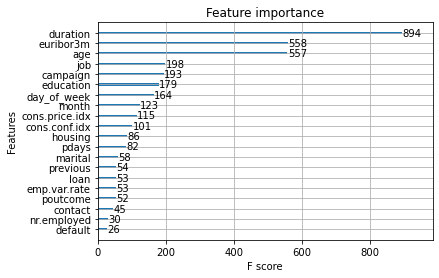

In [96]:
xgb.plot_importance(xgbC)
plt.rcParams['figure.figsize'] = [5, 5]
plt.show()

In [102]:
data_dmatrix = xgb.DMatrix(data = X, label = y)

In [103]:
params = {'max_depth':2, 'eta':1, 'silent':1, 'objective':'binary:logistic'}

In [104]:
# xgb classifier
xgb_clf = xgb.train(params = params, dtrain = data_dmatrix, num_boost_round = 10)

[21:13:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:13:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


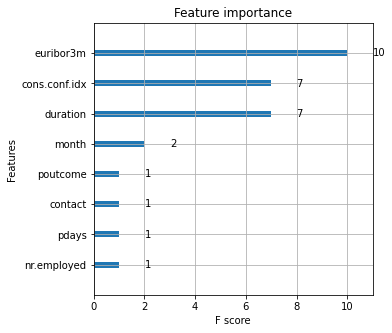

In [108]:
xgb.plot_importance(xgb_clf)
plt.rcParams['figure.figsize'] = [5, 5]
plt.show()

### Lime ELI5 Shap

In [111]:
!pip install eli5
import eli5
from eli5 import show_weights

  Using cached eli5-0.10.1-py2.py3-none-any.whl (105 kB)


C:\Users\savil\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.metrics.scorer module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)
C:\Users\savil\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)


In [149]:
show_weights(xgbC)

Weight,Feature
0.6602,nr.employed
0.0552,emp.var.rate
0.0463,duration
0.0417,cons.conf.idx
0.0289,pdays
0.0172,euribor3m
0.0161,poutcome
0.0157,month
0.0150,contact
0.0133,default


In [113]:
show_weights(DTC)

Weight,Feature
0.3411,x10
0.1548,x19
0.0947,x0
0.0827,x18
0.0448,x1
0.0409,x3
0.0402,x9
0.0391,x11
0.0261,x12
0.0231,x2


In [115]:
show_weights(GBC, show_feature_values = True)

Weight,Feature
0.4676 ± 0.3935,x10
0.2861 ± 0.2334,x19
0.0700 ± 0.3489,x18
0.0484 ± 0.1871,x12
0.0413 ± 0.2224,x17
0.0183 ± 0.1284,x14
0.0176 ± 0.1971,x8
0.0118 ± 0.1042,x16
0.0091 ± 0.2323,x0
0.0077 ± 0.0888,x7


In [116]:
dir(eli5)

['__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '__version__',
 '_decision_path',
 '_feature_importances',
 '_feature_names',
 '_feature_weights',
 '_graphviz',
 'absolute_import',
 'base',
 'base_utils',
 'catboost',
 'explain',
 'explain_prediction',
 'explain_prediction_df',
 'explain_prediction_dfs',
 'explain_prediction_lightgbm',
 'explain_prediction_sklearn',
 'explain_prediction_xgboost',
 'explain_weights',
 'explain_weights_catboost',
 'explain_weights_df',
 'explain_weights_dfs',
 'explain_weights_lightgbm',
 'explain_weights_sklearn',
 'explain_weights_xgboost',
 'format_as_dataframe',
 'format_as_dataframes',
 'format_as_dict',
 'format_as_html',
 'format_as_image',
 'format_as_text',
 'format_html_styles',
 'formatters',
 'ipython',
 'lightgbm',
 'permutation_importance',
 'show_prediction',
 'show_weights',
 'sklearn',
 'transform',
 'transform_feature_names',
 'utils',
 'xgboost']

In [148]:
eli5.show_prediction(xgbC, X_test.iloc[[1]], show_feature_values = True)

In [125]:
X_test.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed'],
      dtype='object')

In [126]:
F_names = ['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed']

In [127]:
F_names

['age',
 'job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'day_of_week',
 'duration',
 'campaign',
 'pdays',
 'previous',
 'poutcome',
 'emp.var.rate',
 'cons.price.idx',
 'cons.conf.idx',
 'euribor3m',
 'nr.employed']

In [147]:
eli5.show_prediction(xgbC, X_test.iloc[[1]], show_feature_values = True, feature_names = F_names)

In [ ]:
## Not really a fan of eli5 for model interpritation, visually not that great and also requires a lot code and data framing

In [140]:
import shap
shap.initjs()

In [144]:
S_explain = shap.TreeExplainer(xgbC)

In [145]:
shap_values = S_explain.shap_values(X_train)

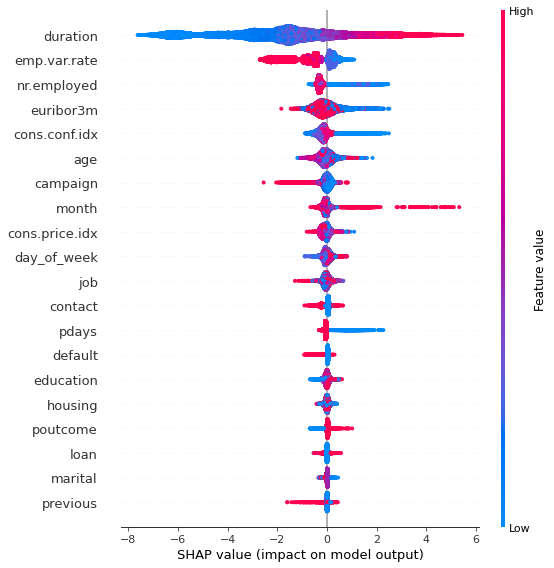

In [146]:
shap.summary_plot(shap_values, X_train)